## Testing Ground

This notebooke is meant to test visuals and stuff.....

In [1]:
library(sf)
library(dplyr)
library(dplyr)
library(ggplot2)

Linking to GEOS 3.6.2, GDAL 2.2.3, PROJ 4.9.3

Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [2]:
boroughs = st_read("/dsa/data/all_datasets/NYC_Boroughs/geo_export_75e4b6a7-325a-4a60-b3eb-43eea473a914.shp")
boroughs

Reading layer `geo_export_75e4b6a7-325a-4a60-b3eb-43eea473a914' from data source `/dsa/data/all_datasets/NYC_Boroughs/geo_export_75e4b6a7-325a-4a60-b3eb-43eea473a914.shp' using driver `ESRI Shapefile'
Simple feature collection with 5 features and 4 fields
geometry type:  MULTIPOLYGON
dimension:      XY
bbox:           xmin: -74.25559 ymin: 40.49612 xmax: -73.70001 ymax: 40.91553
epsg (SRID):    4326
proj4string:    +proj=longlat +ellps=WGS84 +no_defs


shape_leng,shape_area,boro_name,boro_code,geometry
<dbl>,<dbl>,<fct>,<dbl>,<MULTIPOLYGON [°]>
330434.3,1623914402,Staten Island,5,MULTIPOLYGON (((-74.05051 4...
361657.4,636600414,Manhattan,1,MULTIPOLYGON (((-74.01093 4...
741150.8,1937596074,Brooklyn,3,MULTIPOLYGON (((-73.86706 4...
895729.3,3044780164,Queens,4,MULTIPOLYGON (((-73.83668 4...
463454.8,1186618571,Bronx,2,MULTIPOLYGON (((-73.89681 4...


In [3]:
df <- read.csv('module8-exercise1/Taxi_data_8310.csv')

In [4]:
head(df)

passenger_count,trip_distance,RatecodeID,trip_duration_min,day_of_week,time_of_day,DO_Borough,is_airport_trip,is_cbd_congestion,has_extra,has_toll,fare_amount
<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<int>,<int>,<int>,<int>,<dbl>
1,9.92,1,25.95000,Monday,Night,Manhattan,1,1,1,0,42.9
2,6.82,1,10.80000,Monday,Night,Queens,0,0,1,0,26.8
1,3.95,1,16.26667,Monday,Night,Manhattan,0,1,1,0,19.8
1,3.14,1,15.03333,Monday,Night,Manhattan,0,1,1,0,17.7
6,2.81,1,10.53333,Monday,Night,Manhattan,0,1,1,0,14.9
2,2.00,1,12.71667,Monday,Night,Manhattan,0,1,1,0,14.2


In [5]:
colnames(df)

[1] "passenger_count"   "trip_distance"     "RatecodeID"       
 [4] "trip_duration_min" "day_of_week"       "time_of_day"      
 [7] "DO_Borough"        "is_airport_trip"   "is_cbd_congestion"
[10] "has_extra"         "has_toll"          "fare_amount"

In [17]:
count = names(sort(table(df[df$DO_Borough =="Manhattan", ]$day_of_week), decreasing = TRUE))
count

[1] "Tuesday"   "Thursday"  "Wednesday" "Friday"    "Monday"    "Saturday" 
[7] "Sunday"

In [13]:
library(dplyr)
boro_df <- df %>%
  group_by(DO_Borough) %>%
  summarise(total_trips = n(), popular_day = names(sort(table(day_of_week), decreasing = TRUE))[1])

boro_df
boroughs_joined = boroughs %>% left_join(boro_df, by = c("boro_name" = "DO_Borough"))
boroughs_joined <- boroughs_joined %>%  mutate( boro_name = as.character(boro_name) )
boroughs_joined

DO_Borough,total_trips,popular_day
<fct>,<int>,<chr>
Bronx,11076,Tuesday
Brooklyn,108809,Tuesday
Manhattan,2287802,Tuesday
Queens,126394,Monday
Staten Island,641,Tuesday


shape_leng,shape_area,boro_name,boro_code,total_trips,popular_day,geometry
<dbl>,<dbl>,<chr>,<dbl>,<int>,<chr>,<MULTIPOLYGON [°]>
330434.3,1623914402,Staten Island,5,641,Tuesday,MULTIPOLYGON (((-74.05051 4...
361657.4,636600414,Manhattan,1,2287802,Tuesday,MULTIPOLYGON (((-74.01093 4...
741150.8,1937596074,Brooklyn,3,108809,Tuesday,MULTIPOLYGON (((-73.86706 4...
895729.3,3044780164,Queens,4,126394,Monday,MULTIPOLYGON (((-73.83668 4...
463454.8,1186618571,Bronx,2,11076,Tuesday,MULTIPOLYGON (((-73.89681 4...


In [7]:
unique(df$day_of_week)

[1] Monday    Sunday    Tuesday   Wednesday Thursday  Friday    Saturday 
Levels: Friday Monday Saturday Sunday Thursday Tuesday Wednesday

In [8]:
unique(df$time_of_day)

[1] Night     Morning   Afternoon Evening  
Levels: Afternoon Evening Morning Night

In [37]:
days <- c("Monday", "Tuesday", "Wednesday", "Thursday","Friday", "Saturday", "Sunday")
df$day_of_week <- factor(df$day_of_week, levels = days)

tods <- c("Morning", "Afternoon", "Evening", "Night")
df$time_of_day <- factor(df$time_of_day, levels = tods)

In [40]:
dff <- df %>% filter(DO_Borough == "Manhattan")
head(dff)

passenger_count,trip_distance,RatecodeID,trip_duration_min,day_of_week,time_of_day,DO_Borough,is_airport_trip,is_cbd_congestion,has_extra,has_toll,fare_amount
<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<int>,<int>,<int>,<int>,<dbl>
1,9.92,1,25.95000,Monday,Night,Manhattan,1,1,1,0,42.9
1,3.95,1,16.26667,Monday,Night,Manhattan,0,1,1,0,19.8
1,3.14,1,15.03333,Monday,Night,Manhattan,0,1,1,0,17.7
6,2.81,1,10.53333,Monday,Night,Manhattan,0,1,1,0,14.9
2,2.00,1,12.71667,Monday,Night,Manhattan,0,1,1,0,14.2
2,3.10,1,10.20000,Monday,Night,Manhattan,0,1,1,0,14.9


In [46]:
tod_summary <-  dff %>%count(time_of_day) %>%mutate(percentage = n / sum(n) * 100)
head(tod_summary)

time_of_day,n,percentage
<fct>,<int>,<dbl>
Morning,484993,21.199081
Afternoon,692831,30.283696
Evening,889674,38.887718
Night,220304,9.629505


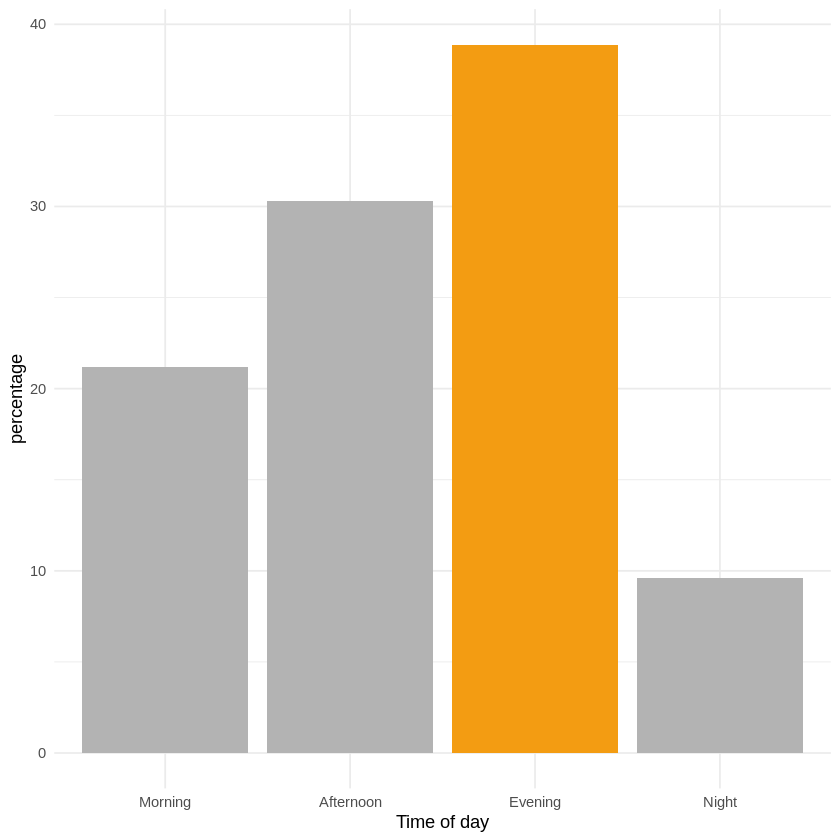

In [44]:
#Bar chart
data <- tod_summary
data <- data %>%mutate(color = ifelse(percentage == max(percentage), "#F39C12", "grey70"))
ggplot(data, aes(x =time_of_day , y =percentage , fill = color)) +
geom_col() +
scale_fill_identity()+
xlab("Time of day") +
theme_minimal()


In [49]:
weekly_fare_tod <- dff %>%
filter(time_of_day == 'Night' ) %>%
group_by(day_of_week) %>%
summarise(avg_fare = mean(fare_amount, na.rm = TRUE))

weekly_fare_tod

day_of_week,avg_fare
<fct>,<dbl>
Monday,22.11340
Tuesday,21.23061
Wednesday,19.49941
Thursday,18.75523
Friday,17.79291
Saturday,15.88239
Sunday,16.44655


In [50]:
weekly_fare_boro <-dff %>% group_by(day_of_week) %>% summarise(avg_fare = mean(fare_amount))
weekly_fare_boro

day_of_week,avg_fare
<fct>,<dbl>
Monday,19.11822
Tuesday,18.18565
Wednesday,18.36807
Thursday,18.56338
Friday,18.28056
Saturday,17.60161
Sunday,18.84248


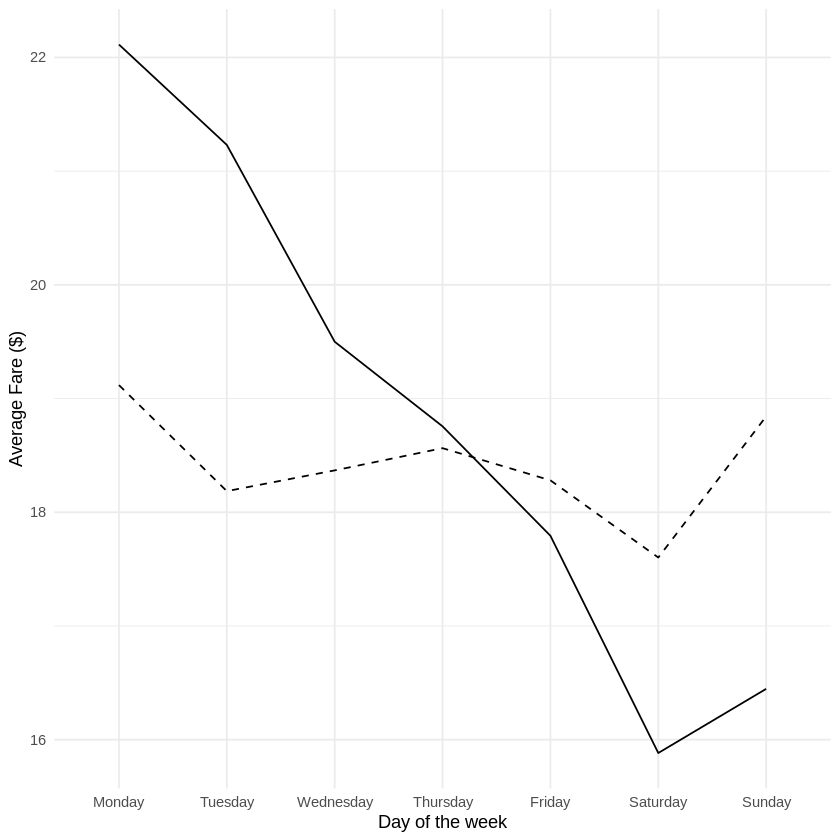

In [55]:
ggplot() +
geom_line(data = weekly_fare_tod,aes(day_of_week,avg_fare),linetype = "solid", color = 'black', group=1)+
geom_line(data = weekly_fare_boro,aes(day_of_week,avg_fare),linetype = "dashed", color = 'black', group = 1) +
xlab("Day of the week")+
ylab("Average Fare ($)")+
theme_minimal()
    
